<a href="https://colab.research.google.com/github/jtting22/ca03/blob/main/JTING_CA03.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. Importing Packages

In [ ]:
#import necessary packages to run the program
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib notebook
%matplotlib inline
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from six import StringIO
from IPython.display import Image  
import graphviz
from sklearn.tree import export_graphviz
import pydotplus
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [ ]:
#Mounting GoogleDrive in order to read the needed files
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


2. Data Quality Analysis

In [ ]:
#read the dataset using read_csv (Make sure your file is saved to a Google drive file similar to this path)
#note that later in the process, we will break out this csv file into two datatsets ('train' and 'test' files)
census_data = pd.read_csv('/content/drive/My Drive/Data Files/CA03/census_data.csv')

In [ ]:
#We obtain a preview of the first five records for our dataset.
census_data.head()


,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


In [ ]:
#To showcase the amount of rows and columns we will use a .shape function
census_data.shape

(48842, 11)

In [ ]:
#With this function we can determine all the non-null values within our dataset
census_data.count()
#Unless there are missing data across the board we can assume there will be no null values based off of our results.  Regardless we will still see if there are any null values below.

hours_per_week_bin    48842
occupation_bin        48842
msr_bin               48842
capital_gl_bin        48842
race_sex_bin          48842
education_num_bin     48842
education_bin         48842
workclass_bin         48842
age_bin               48842
flag                  48842
y                     48842
dtype: int64

In [ ]:
#With this function we can see how many null variables there are in our census dataset
census_data.isnull().sum()
#With these results we can see that there are no null values in the dataset thus meaning no need for removal. 

hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64

In [ ]:
#Using the .info function we can determine the number of values in each column as well as the datatype.  We can see that our only numerical column is the "y column"
census_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   hours_per_week_bin  48842 non-null  object
 1   occupation_bin      48842 non-null  object
 2   msr_bin             48842 non-null  object
 3   capital_gl_bin      48842 non-null  object
 4   race_sex_bin        48842 non-null  object
 5   education_num_bin   48842 non-null  object
 6   education_bin       48842 non-null  object
 7   workclass_bin       48842 non-null  object
 8   age_bin             48842 non-null  object
 9   flag                48842 non-null  object
 10  y                   48842 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 4.1+ MB


In [ ]:
#using the .describe function we want to see the descriptive statistics of the dataset 
census_data.describe(include = 'all')

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
count,48842,48842,48842,48842,48842,48842,48842,48842,48842,48842,48842.000000
unique,5,5,3,3,3,5,5,2,5,2,NaN
top,b. 31-40,c. Mid - Mid,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,e. 40-55,train,NaN
freq,26639,13971,22047,42525,29737,30324,30324,46012,13963,32561,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.239282
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.426649
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000


In [ ]:
#split the train and the test data for usage
split = census_data['flag'].unique()
print(split)

for value in split:
    train_data = census_data[census_data['flag']== 'train']
    test_data = census_data[census_data['flag']== 'test']

['train' 'test']


In [ ]:
#using the head function we will check to see if our data was imported properly with the appropriate headers/rows
train_data.head()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


**3.0 Exploratory Data Analysis (EDA)**

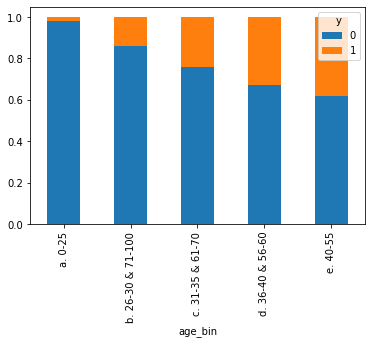

In [ ]:
#In this chart we are looking at the 5 bins of the age section in our dataset.
pd.crosstab(census_data['age_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

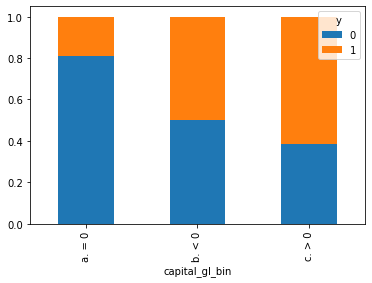

In [ ]:
#In this chart we are looking at the 3 bins of the capital section in our dataset
pd.crosstab(census_data['capital_gl_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

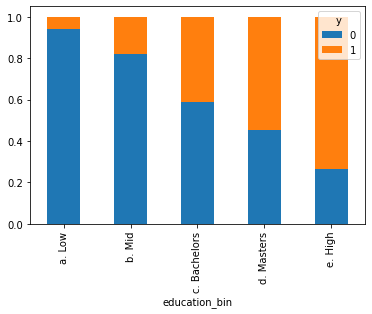

In [ ]:
#In this chart we are looking at the 5 bins of the education section in our dataset
pd.crosstab(census_data['education_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

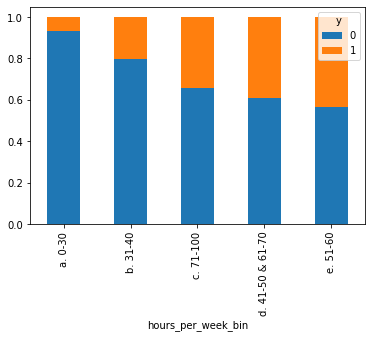

In [ ]:
#In this chart we are looking at the 5 bins of the hours per week section in our dataset
pd.crosstab(census_data['hours_per_week_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

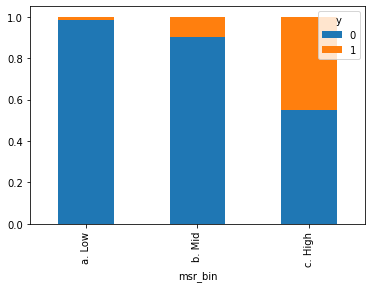

In [ ]:
#In this chart we are looking at the 3 bins of the marriage/relationship status bin section in our dataset
pd.crosstab(census_data['msr_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

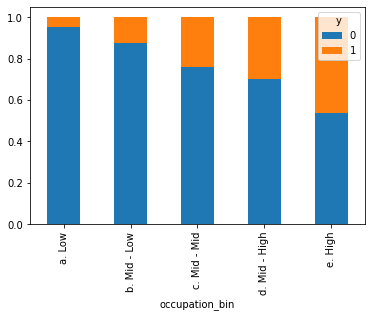

In [ ]:

#In this chart we are looking at the 5 bins of the occupation bin section in our dataset
pd.crosstab(census_data['occupation_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

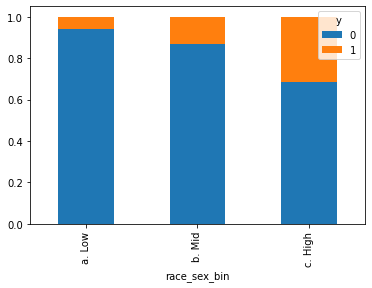

In [ ]:
#In this chart we are looking at the 3 bins of the race and sex bin section in our dataset
pd.crosstab(census_data['race_sex_bin'],census_data['y'],normalize='index').plot(kind='bar',stacked=True)

In [ ]:
#Splitting the data between train and test
train=census_data[census_data['flag']=='train']
train
test=census_data[census_data['flag']=='test']
test

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
32561,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,a. 0-8,a. Low,b. income,a. 0-25,test,0
32562,d. 41-50 & 61-70,b. Mid - Low,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,test,0
32563,b. 31-40,d. Mid - High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,b. 26-30 & 71-100,test,1
32564,b. 31-40,b. Mid - Low,c. High,c. > 0,b. Mid,b. 9-12,b. Mid,b. income,e. 40-55,test,1
32565,a. 0-30,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,a. 0-25,test,0
...,...,...,...,...,...,...,...,...,...,...,...
48837,b. 31-40,e. High,b. Mid,a. = 0,b. Mid,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48838,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,c. 31-35 & 61-70,test,0
48839,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48840,b. 31-40,b. Mid - Low,a. Low,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,test,0


In [ ]:
#creating dummy variables for all of our bins to make our decisison tree run
x_train = pd.get_dummies(train[['age_bin', 'capital_gl_bin', 'education_bin','hours_per_week_bin', 'msr_bin', 'occupation_bin', 'race_sex_bin','education_num_bin','workclass_bin']],drop_first=True)
y_train=train['y']
x_test=pd.get_dummies(test[['age_bin', 'capital_gl_bin', 'education_bin','hours_per_week_bin', 'msr_bin', 'occupation_bin', 'race_sex_bin','education_num_bin','workclass_bin']],drop_first=True)
y_test=test['y']

In [ ]:
#Building our decision based tree for interpretation
dtree=DecisionTreeClassifier(max_depth=10,random_state=101, max_features=None, min_samples_leaf=15)
dtree.fit(x_train,y_train)
y_pred=dtree.predict(x_test)

import timeit
code_to_test = """
a = range(100000)
b = []
for i in a:
    b.append(i*2)
"""
elapsed_time = timeit.timeit(code_to_test, number=100)/100
print(elapsed_time)

0.03415008873000005


# 4. Visualize Your Decision Tree Using Graph Viz



In [ ]:
#importing appropriate packages 
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier(max_depth=10, random_state=101, 
                               max_features=None, min_samples_leaf=15)

dtree.fit(x_train, y_train)
y_pred=dtree.predict(x_test)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.889417 to fit



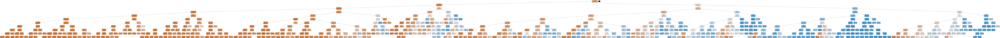

In [ ]:
#importing more packages and then vizualizing the decision tree using graphviz
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# 5. Evaluate Decision Tree Performance

[[11521   914]
 [ 1653  2193]]


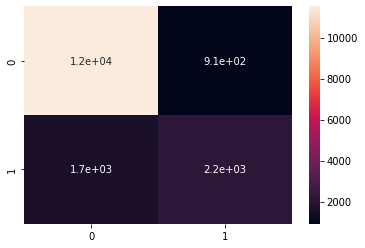

In [ ]:
#Generating a heatmap matrix 
print(metrics.confusion_matrix(y_test, y_pred))

sns.heatmap(metrics.confusion_matrix(y_test, y_pred), annot=True)

In [ ]:
#Generating the accuracy score
print(accuracy_score(y_test, y_pred))

0.8423315521159634


In [ ]:
#Generating the Precision, Recall, & F1 Scores
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281



In [ ]:
#Generating the AUC value
print(roc_auc_score(y_test, y_pred))

0.7483502983062628


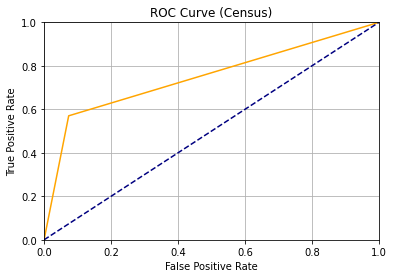

In [ ]:
#ROC Curve shows us the TPR (True Positive Rate) vs the FPR(False Positive Rate) 
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)

plt.figure()
plt.plot(fpr, tpr, color='orange')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Census)')
plt.grid(True)
plt.show()

# 6. Tune Decision Tree Performance

In [ ]:
tree_tuning = pd.read_csv('/content/drive/My Drive/Data Files/CA03/tune.csv')

In [ ]:
#this showcases our random input with reasonable number to determine tree tuning performance prior to automaton
tree_tuning


,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,Entropy,3,9,18,NaN,NaN,NaN,NaN
1,Entropy,8,5,5,NaN,NaN,NaN,NaN
2,Entropy,5,11,30,NaN,NaN,NaN,NaN
3,Entropy,7,14,6,NaN,NaN,NaN,NaN
4,Gini,12,3,4,NaN,NaN,NaN,NaN
5,Gini,2,6,20,NaN,NaN,NaN,NaN
6,Gini,9,9,6,NaN,NaN,NaN,NaN
7,Gini,15,13,40,NaN,NaN,NaN,NaN


# **Entropy Values**

In [ ]:
#Analyzing our entropy values.  Please note that because the DecisionTreeClasifier uses gini as a default you need to specify that the criteria is entropy for it to work properly.
dtree1=DecisionTreeClassifier(criterion='entropy', min_samples_split=3, min_samples_leaf=9,max_depth=18)
dtree1.fit(x_train,y_train)
y_pred1=dtree1.predict(x_test)

accuracy1=accuracy_score(y_test, y_pred1)
print('ENTROPY TREE 1')
print("Accuracy:",accuracy1)
print('')
print(classification_report(y_test, y_pred1))

ENTROPY TREE 1
Accuracy: 0.8394447515508875

              precision    recall  f1-score   support

           0       0.87      0.92      0.90     12435
           1       0.70      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [ ]:
dtree2=DecisionTreeClassifier(criterion='entropy', min_samples_split=8, min_samples_leaf=5,max_depth=5)
dtree2.fit(x_train,y_train)
y_pred2=dtree2.predict(x_test)

accuracy2=accuracy_score(y_test, y_pred2)
print('ENTROPY TREE 2')
print("Accuracy:",accuracy2)
print('')
print(classification_report(y_test, y_pred2))

ENTROPY TREE 2
Accuracy: 0.8278361280019655

              precision    recall  f1-score   support

           0       0.85      0.94      0.89     12435
           1       0.70      0.48      0.57      3846

    accuracy                           0.83     16281
   macro avg       0.77      0.71      0.73     16281
weighted avg       0.82      0.83      0.82     16281



In [ ]:
dtree3=DecisionTreeClassifier(criterion='entropy', min_samples_split=5, min_samples_leaf=11,max_depth=30)
dtree3.fit(x_train,y_train)
y_pred3=dtree3.predict(x_test)

accuracy3=accuracy_score(y_test, y_pred3)
print('ENTROPY TREE 3 ')
print("Accuracy:",accuracy3)
print('')
print(classification_report(y_test, y_pred3))

ENTROPY TREE 3 
Accuracy: 0.8407345986118788

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [ ]:
dtree4=DecisionTreeClassifier(criterion='entropy', min_samples_split=7, min_samples_leaf=14,max_depth=6)
dtree4.fit(x_train,y_train)
y_pred4=dtree4.predict(x_test)

accuracy4=accuracy_score(y_test, y_pred4)
print('ENTROPY TREE 4 ')
print("Accuracy:",accuracy4)
print('')
print(classification_report(y_test, y_pred4))

ENTROPY TREE 4 
Accuracy: 0.8355137890792949

              precision    recall  f1-score   support

           0       0.86      0.93      0.90     12435
           1       0.71      0.52      0.60      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.73      0.75     16281
weighted avg       0.83      0.84      0.83     16281



# **Gini Impurity Values**

In [ ]:
#Analyzing our entropy values.  Please note that because the DecisionTreeClasifier uses gini as a default you do not need to specify that it is a gini via criterion.
dtree5=DecisionTreeClassifier(min_samples_split=12, min_samples_leaf=3, max_depth=4)
dtree5.fit(x_train,y_train)
y_pred5=dtree5.predict(x_test)

accuracy5=accuracy_score(y_test, y_pred5)
print('GINI TREE 1')
print("Accuracy:",accuracy5)
print('')
print(classification_report(y_test, y_pred5))

GINI TREE 1
Accuracy: 0.8303544008353295

              precision    recall  f1-score   support

           0       0.88      0.91      0.89     12435
           1       0.66      0.58      0.62      3846

    accuracy                           0.83     16281
   macro avg       0.77      0.75      0.76     16281
weighted avg       0.82      0.83      0.83     16281



In [ ]:
dtree6=DecisionTreeClassifier(min_samples_split=2, min_samples_leaf=6, max_depth=20)
dtree6.fit(x_train,y_train)
y_pred6=dtree6.predict(x_test)

accuracy6=accuracy_score(y_test, y_pred6)
print('GINI TREE 2')
print("Accuracy:",accuracy6)
print('')
print(classification_report(y_test, y_pred6))

GINI TREE 2
Accuracy: 0.8387691173760825

              precision    recall  f1-score   support

           0       0.87      0.92      0.90     12435
           1       0.70      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.78      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [ ]:
dtree7=DecisionTreeClassifier(min_samples_split=9, min_samples_leaf=9, max_depth=6)
dtree7.fit(x_train,y_train)
y_pred7=dtree7.predict(x_test)

accuracy7=accuracy_score(y_test, y_pred7)
print('GINI TREE 3')
print("Accuracy:",accuracy7)
print('')
print(classification_report(y_test, y_pred7))

GINI TREE 3
Accuracy: 0.8337939929979731

              precision    recall  f1-score   support

           0       0.86      0.94      0.90     12435
           1       0.71      0.50      0.59      3846

    accuracy                           0.83     16281
   macro avg       0.78      0.72      0.74     16281
weighted avg       0.82      0.83      0.82     16281



In [ ]:
dtree8=DecisionTreeClassifier(min_samples_split=15, min_samples_leaf=13, max_depth=40)
dtree8.fit(x_train,y_train)
y_pred8=dtree8.predict(x_test)

accuracy8=accuracy_score(y_test, y_pred8)
print('GINI TREE 4')
print("Accuracy:",accuracy8)
print('')
print(classification_report(y_test, y_pred8))

GINI TREE 4
Accuracy: 0.8397518579939807

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.56      0.62      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.74      0.76     16281
weighted avg       0.83      0.84      0.83     16281



In [ ]:
#Based off of the accuracy of all of our decision trees (both gini/entropy) we determine that the best tree is Decision Tree 3 or "Entropy Tree 3". The following code visualzies our best tree.
dot_data = StringIO()
export_graphviz(dtree3, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.566394 to fit



# **7. Automaton of Performance Tuning**

In [ ]:
#For a reminder, this is what our current dataframe looks like
tree_tuning 

,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,Entropy,3,9,18,NaN,NaN,NaN,NaN
1,Entropy,8,5,5,NaN,NaN,NaN,NaN
2,Entropy,5,11,30,NaN,NaN,NaN,NaN
3,Entropy,7,14,6,NaN,NaN,NaN,NaN
4,Gini,12,3,4,NaN,NaN,NaN,NaN
5,Gini,2,6,20,NaN,NaN,NaN,NaN
6,Gini,9,9,6,NaN,NaN,NaN,NaN
7,Gini,15,13,40,NaN,NaN,NaN,NaN


In [ ]:
#The following code will automate the manual process that wer did above and then we can transfer the data to an excel file for easier access.
for i in range(len(tree_tuning)):
  if tree_tuning['Split Criteria (Entropy or Gini)'][i] == 'Entropy':

    dtree=DecisionTreeClassifier(criterion='entropy', min_samples_split=tree_tuning['Minimum Sample Split'][i],max_depth=tree_tuning['Maximum Depth'][i], min_samples_leaf=tree_tuning['Minimum Sample Leaf'][i])
    dtree.fit(x_train,y_train)
    y_pred=dtree.predict(x_test)
    print('Criteria: ENTROPY')
    accuracy=accuracy_score(y_test, y_pred)
    print("Accuracy:",accuracy)

    print(classification_report(y_test, y_pred))
    print('----------------------------------------------------------')
  else:

    dtree=DecisionTreeClassifier(min_samples_split=tree_tuning['Minimum Sample Split'][i],max_depth=tree_tuning['Maximum Depth'][i], min_samples_leaf=tree_tuning['Minimum Sample Leaf'][i])
    dtree.fit(x_train,y_train)
    y_pred=dtree.predict(x_test)
    print('Criteria: GINI')
    accuracy=accuracy_score(y_test, y_pred)
    print("Accuracy:",accuracy)

    print(classification_report(y_test, y_pred))
    print('----------------------------------------------------------')

Criteria: ENTROPY
Accuracy: 0.8395061728395061
              precision    recall  f1-score   support

           0       0.87      0.92      0.90     12435
           1       0.70      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.83     16281

----------------------------------------------------------
Criteria: ENTROPY
Accuracy: 0.8278361280019655
              precision    recall  f1-score   support

           0       0.85      0.94      0.89     12435
           1       0.70      0.48      0.57      3846

    accuracy                           0.83     16281
   macro avg       0.77      0.71      0.73     16281
weighted avg       0.82      0.83      0.82     16281

----------------------------------------------------------
Criteria: ENTROPY
Accuracy: 0.8408574411891161
              precision    recall  f1-score   support

           0       0.87      0.9

# **8. Prediction using your "trained" Decision Tree Model**

In [ ]:
#In order for us to use a prediction for the trained decision tree model we need to create a new dataframe of what we want to predict.
df=pd.DataFrame({'age_bin_b. 26-30 & 71-100':0,'age_bin_c. 31-35 & 61-70':0,'age_bin_d. 36-40 & 56-60':1,'age_bin_e. 40-55':0,'capital_gl_bin_b. < 0':0,'capital_gl_bin_c. > 0':1,'education_bin_b. Mid':0,'education_bin_c. Bachelors':0,'education_bin_d. Masters':0,'education_bin_e. High':1,'hours_per_week_bin_b. 31-40':0,'hours_per_week_bin_c. 71-100':0,'hours_per_week_bin_d. 41-50 & 61-70':1,'hours_per_week_bin_e. 51-60':0,'msr_bin_b. Mid':0,'msr_bin_c. High':1,'occupation_bin_b. Mid - Low':1,'occupation_bin_c. Mid - Mid':0,'occupation_bin_d. Mid - High':0,'occupation_bin_e. High':0,'race_sex_bin_b. Mid':1,'race_sex_bin_c. High':0,'education_num_bin_b. 9-12':1,'education_num_bin_c. 13':0,'education_num_bin_d. 14':0,'education_num_bin_e. 15+':0,'workclass_bin_b. income':1},index=[0])
df

,age_bin_b. 26-30 & 71-100,age_bin_c. 31-35 & 61-70,age_bin_d. 36-40 & 56-60,age_bin_e. 40-55,capital_gl_bin_b. < 0,capital_gl_bin_c. > 0,education_bin_b. Mid,education_bin_c. Bachelors,education_bin_d. Masters,education_bin_e. High,hours_per_week_bin_b. 31-40,hours_per_week_bin_c. 71-100,hours_per_week_bin_d. 41-50 & 61-70,hours_per_week_bin_e. 51-60,msr_bin_b. Mid,msr_bin_c. High,occupation_bin_b. Mid - Low,occupation_bin_c. Mid - Mid,occupation_bin_d. Mid - High,occupation_bin_e. High,race_sex_bin_b. Mid,race_sex_bin_c. High,education_num_bin_b. 9-12,education_num_bin_c. 13,education_num_bin_d. 14,education_num_bin_e. 15+,workclass_bin_b. income
0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,0,1,0,0,0,1


In [ ]:
#Aftter the dataframe is completed we can utilize our program to run the Decision Tree algorithm.  The confidence of our preidciton is .72 and because our result is 0 we know that the income for this type of person is below or equal to 50k.
dtree=DecisionTreeClassifier(criterion='entropy', min_samples_split=2,max_depth=10, min_samples_leaf=15)
dtree = dtree.fit(x_train,y_train)
y_pred=dtree.predict(df)
print(y_pred)
if y_pred == 0:
  print('The income for this type of person is equal or below 50k.')
else:
  print('The income for this type of person is higher than 50k.')

x_prob=[[0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,0,1,0,0,0,1]]
y_pred=dtree.predict(x_prob)
prob=dtree.predict_proba(x_prob)

print('The confidence of the prediction is ',prob[0][y_pred])

[0]
The income for this type of person is equal or below 50k.
The Confidence of the prediciton is  [0.72413793]


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"
